In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from scipy.stats import zscore

In [2]:
df = pd.read_csv('stud.csv')
df.head()

,age,gender,job_type,daily_social_media_time,social_platform_preference,number_of_notifications,work_hours_per_day,perceived_productivity_score,actual_productivity_score,stress_level,sleep_hours,screen_time_before_sleep,breaks_during_work,uses_focus_apps,has_digital_wellbeing_enabled,coffee_consumption_per_day,days_feeling_burnout_per_month,weekly_offline_hours,job_satisfaction_score
0,56,Male,Unemployed,4.180940,Facebook,61,6.753558,8.040464,7.291555,4.0,5.116546,0.419102,8,False,False,4,11,21.927072,6.336688
1,46,Male,Health,3.249603,Twitter,59,9.169296,5.063368,5.165093,7.0,5.103897,0.671519,7,True,True,2,25,0.000000,3.412427
2,32,Male,Finance,NaN,Twitter,57,7.910952,3.861762,3.474053,4.0,8.583222,0.624378,0,True,False,3,17,10.322044,2.474944
3,60,Female,Unemployed,NaN,Facebook,59,6.355027,2.916331,1.774869,6.0,6.052984,1.204540,1,False,False,0,4,23.876616,1.733670
4,25,Male,IT,NaN,Telegram,66,6.214096,8.868753,NaN,7.0,5.405706,1.876254,1,False,True,1,30,10.653519,9.693060


In [ ]:
df.info()

In [ ]:
df.describe()

In [3]:
df.isnull().sum()

age                                  0
gender                               0
job_type                             0
daily_social_media_time           2765
social_platform_preference           0
number_of_notifications              0
work_hours_per_day                   0
perceived_productivity_score      1614
actual_productivity_score         2365
stress_level                      1904
sleep_hours                       2598
screen_time_before_sleep          2211
breaks_during_work                   0
uses_focus_apps                      0
has_digital_wellbeing_enabled        0
coffee_consumption_per_day           0
days_feeling_burnout_per_month       0
weekly_offline_hours                 0
job_satisfaction_score            2730
dtype: int64

In [ ]:
# needs binning for more added weight to age groups
df['age'].value_counts(dropna=False)

In [ ]:
df.hist('job_satisfaction_score')
plt.show()

In [4]:
# handling missing data with median because this attribute has many outliers
median_dsmt = df['daily_social_media_time'].median()   
df['daily_social_media_time'].fillna(median_dsmt, inplace=True)  

median_stbs = df['screen_time_before_sleep'].median()  
df['screen_time_before_sleep'].fillna(median_stbs, inplace=True)  

C:\Users\PC\AppData\Local\Temp\ipykernel_1056\1960074530.py:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['daily_social_media_time'].fillna(median_dsmt, inplace=True)
C:\Users\PC\AppData\Local\Temp\ipykernel_1056\1960074530.py:6: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.



In [5]:

mean_pds = df['perceived_productivity_score'].mean()
df['perceived_productivity_score'].fillna(mean_pds, inplace=True)

mean_sl = df['stress_level'].mean()
df['stress_level'].fillna(mean_sl, inplace=True)

mean_sh = df['sleep_hours'].mean()
df['sleep_hours'].fillna(mean_sh, inplace=True)

mean_jss = df['job_satisfaction_score'].mean()
df['job_satisfaction_score'].fillna(mean_jss, inplace=True)

# perceived_productivity_score      1614
# actual_productivity_score         2365
# stress_level                      1904
# sleep_hours                       2598

C:\Users\PC\AppData\Local\Temp\ipykernel_1056\2091366096.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['perceived_productivity_score'].fillna(mean_pds, inplace=True)
C:\Users\PC\AppData\Local\Temp\ipykernel_1056\2091366096.py:5: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

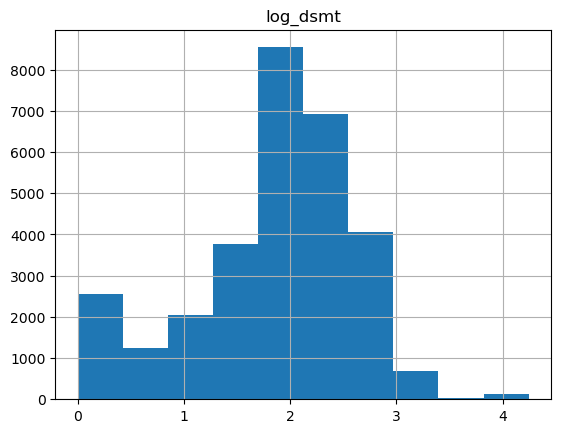

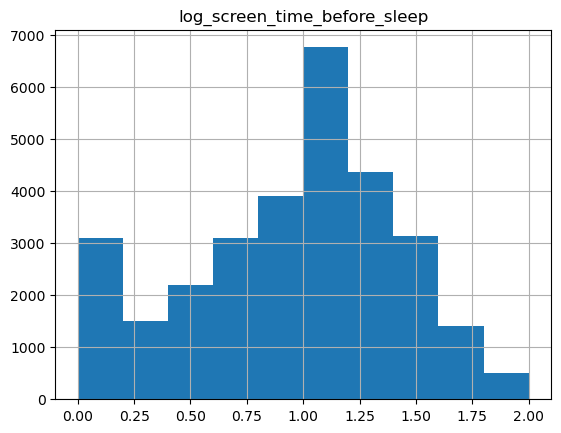

In [6]:
df['log_dsmt'] = np.log2(df['daily_social_media_time']+1)
df['log_screen_time_before_sleep'] = np.log2(df['screen_time_before_sleep']+1)

df.hist('log_dsmt')
df.hist('log_screen_time_before_sleep')
plt.show()

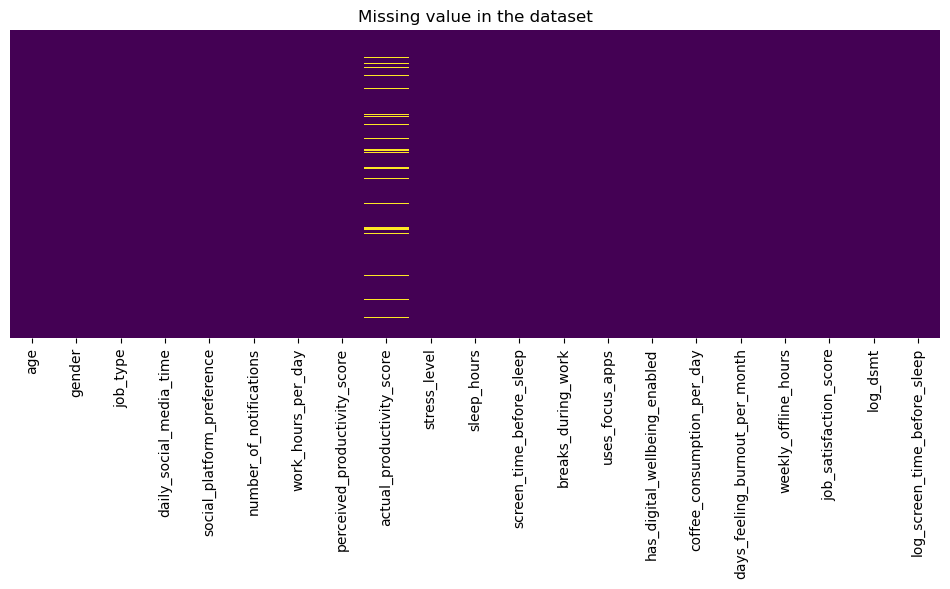

In [7]:

plt.figure(figsize=(12,4))
sns.heatmap(df.isnull(),cbar=False,cmap='viridis',yticklabels=False)
plt.title('Missing value in the dataset');

In [8]:
correlations = df.corr(numeric_only=True)
correlations

,age,daily_social_media_time,number_of_notifications,work_hours_per_day,perceived_productivity_score,actual_productivity_score,stress_level,sleep_hours,screen_time_before_sleep,breaks_during_work,uses_focus_apps,has_digital_wellbeing_enabled,coffee_consumption_per_day,days_feeling_burnout_per_month,weekly_offline_hours,job_satisfaction_score,log_dsmt,log_screen_time_before_sleep
age,1.000000,-0.002440,-0.003799,-0.003231,0.008585,0.010575,0.005264,0.002657,0.005075,-0.010918,0.001524,-0.005594,-0.001162,-0.002998,0.003086,0.013443,-0.001610,0.004822
daily_social_media_time,-0.002440,1.000000,-0.000876,-0.002855,-0.010445,-0.010486,0.000664,0.010654,-0.003910,0.014209,-0.004828,-0.003692,-0.003930,0.002301,-0.001430,-0.004012,0.926008,-0.004677
number_of_notifications,-0.003799,-0.000876,1.000000,0.013068,-0.003768,0.000457,-0.002994,0.003901,0.013328,0.008816,0.004320,-0.001722,0.006088,0.005248,-0.000938,-0.004498,0.000757,0.015552
work_hours_per_day,-0.003231,-0.002855,0.013068,1.000000,0.003814,-0.000113,0.002276,0.000895,-0.007136,-0.008151,-0.000395,0.002251,-0.003071,0.003391,-0.002061,-0.002058,-0.000007,-0.006957
perceived_productivity_score,0.008585,-0.010445,-0.003768,0.003814,1.000000,0.938977,0.001883,-0.012563,0.001721,-0.003013,-0.003760,-0.006750,0.000008,-0.011192,-0.004751,0.791146,-0.009954,0.000161
actual_productivity_score,0.010575,-0.010486,0.000457,-0.000113,0.938977,1.000000,0.001302,-0.007511,0.002380,-0.004203,-0.001023,-0.006856,0.001156,-0.011001,-0.004839,0.842238,-0.008694,0.000367
stress_level,0.005264,0.000664,-0.002994,0.002276,0.001883,0.001302,1.000000,0.003815,-0.001290,0.001102,0.001984,-0.011302,-0.000705,-0.000543,-0.004291,-0.000526,0.003006,-0.002845
sleep_hours,0.002657,0.010654,0.003901,0.000895,-0.012563,-0.007511,0.003815,1.000000,-0.001381,0.005373,0.001305,0.000156,0.009301,-0.005022,-0.006689,-0.004652,0.009106,-0.002834
screen_time_before_sleep,0.005075,-0.003910,0.013328,-0.007136,0.001721,0.002380,-0.001290,-0.001381,1.000000,-0.004169,-0.009959,0.001626,-0.003839,0.001355,-0.002838,0.004972,-0.002160,0.981255
breaks_during_work,-0.010918,0.014209,0.008816,-0.008151,-0.003013,-0.004203,0.001102,0.005373,-0.004169,1.000000,-0.004046,0.001016,0.004647,-0.003668,0.006579,-0.003113,0.008075,-0.004159


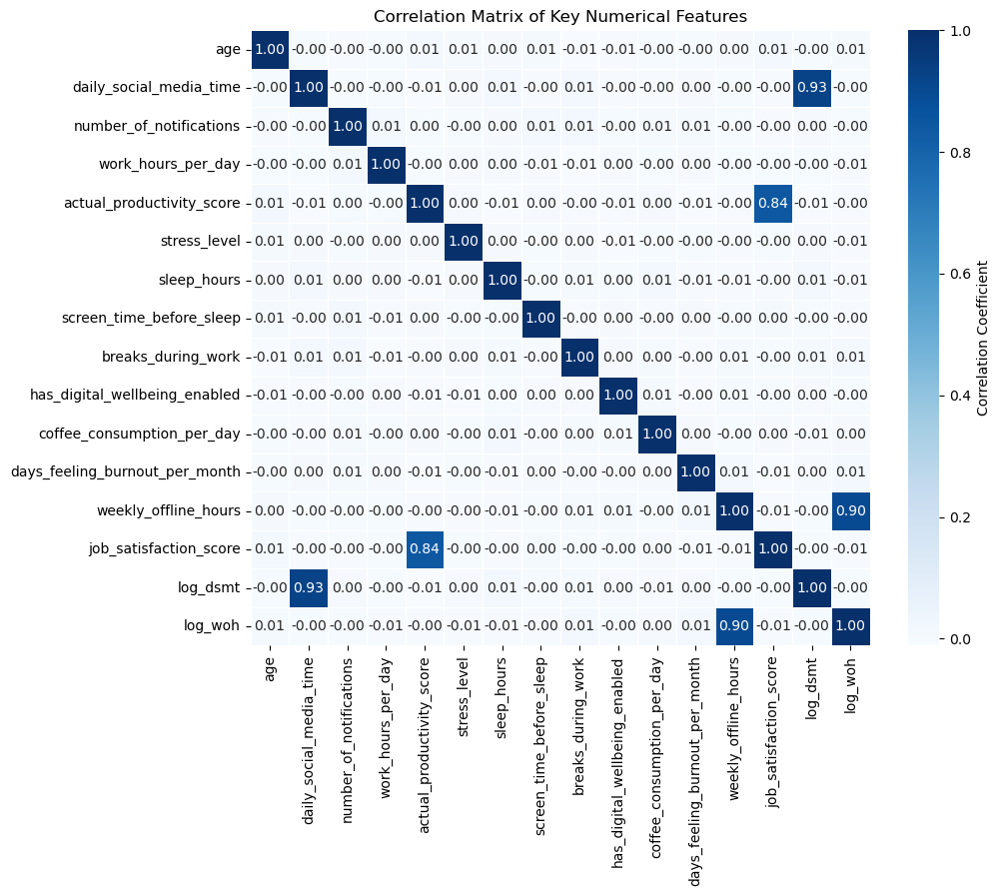

In [65]:
numerical_cols = [
    'age', 
    'daily_social_media_time', 
    'number_of_notifications', 
    'work_hours_per_day',  
    'actual_productivity_score', 
    'stress_level', 
    'sleep_hours',
    'screen_time_before_sleep',
    'breaks_during_work',
    'has_digital_wellbeing_enabled',
    'coffee_consumption_per_day',
    'days_feeling_burnout_per_month',
    'weekly_offline_hours',	
    'job_satisfaction_score',	
    'log_dsmt',
    'log_woh'
]

corr_matrix = df[numerical_cols].corr()

# 2. Visualize the correlation matrix as a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(
    corr_matrix, 
    annot=True,            
    fmt=".2f",             
    cmap='Blues',       
    linewidths=.5,         
    cbar_kws={'label': 'Correlation Coefficient'}
)
plt.title('Correlation Matrix of Key Numerical Features')
plt.show()

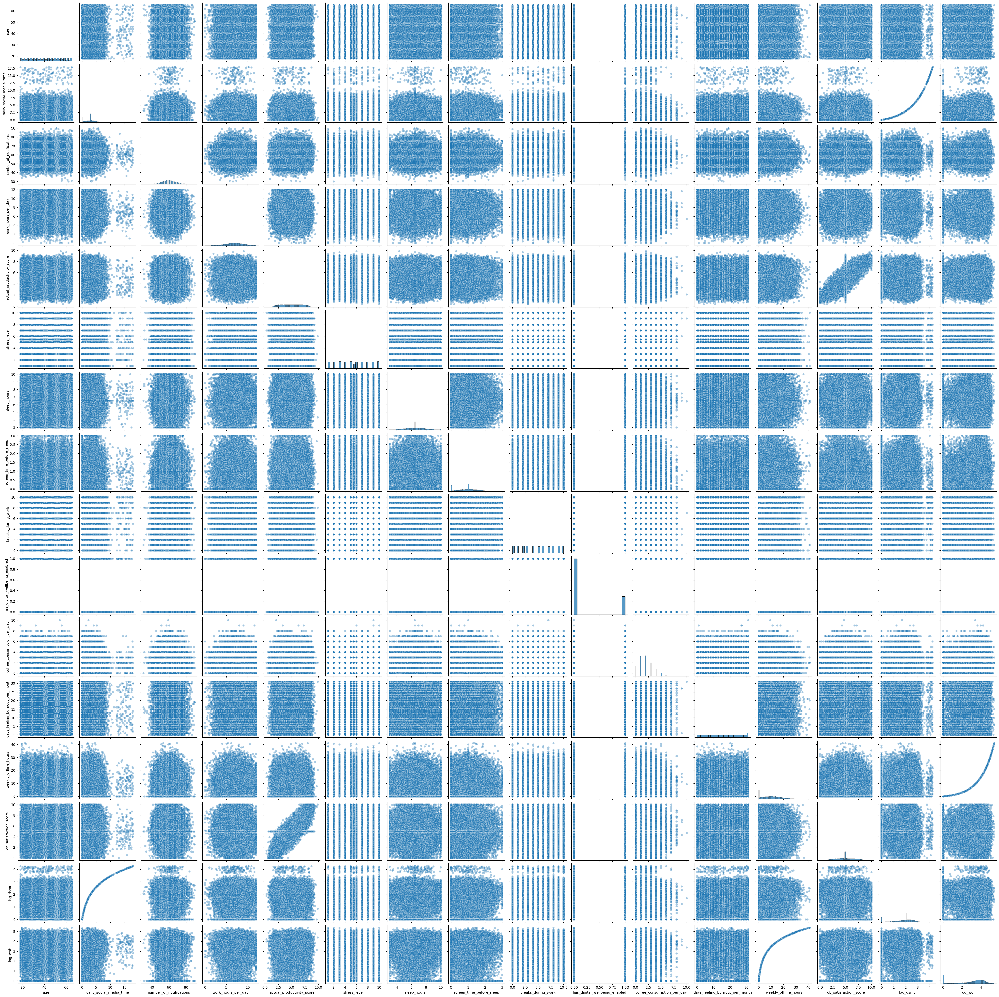

In [66]:
sns.pairplot(df[numerical_cols], kind='scatter', plot_kws={'alpha' : 0.4})

In [ ]:
df.boxplot(column=['actual_productivity_score'], by='social_platform_preference')

In [ ]:
df.boxplot(column=['actual_productivity_score'], by='age')

In [ ]:
df.boxplot(column=['actual_productivity_score'], by='gender')

In [ ]:
df.boxplot(column=['actual_productivity_score'], by='job_type')

In [21]:
# dropping useless categorical columns
df.drop(df.columns[[10]], axis=1, inplace=True)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 21 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   age                             30000 non-null  int64  
 1   gender                          30000 non-null  object 
 2   job_type                        30000 non-null  object 
 3   daily_social_media_time         30000 non-null  float64
 4   social_platform_preference      30000 non-null  object 
 5   number_of_notifications         30000 non-null  int64  
 6   work_hours_per_day              30000 non-null  float64
 7   perceived_productivity_score    30000 non-null  float64
 8   actual_productivity_score       27635 non-null  float64
 9   stress_level                    30000 non-null  float64
 10  sleep_hours                     30000 non-null  float64
 11  screen_time_before_sleep        30000 non-null  float64
 12  breaks_during_work              

# Analyzing Weekly offline hours

In [43]:
df['weekly_offline_hours'].value_counts(dropna=False)       

# a lot have less than an hour offline which doesnt make sense

weekly_offline_hours
0.000000     3264
21.927072       1
18.277082       1
5.705870        1
16.573384       1
             ... 
12.767974       1
8.095881        1
12.110620       1
20.032649       1
6.324954        1
Name: count, Length: 26737, dtype: int64

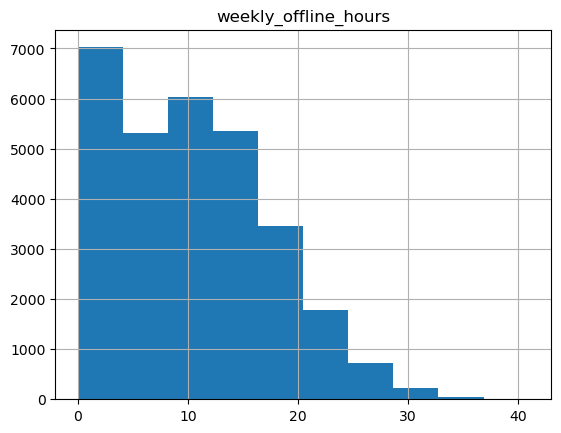

In [44]:
df.hist('weekly_offline_hours')
plt.show()

#skewness
#

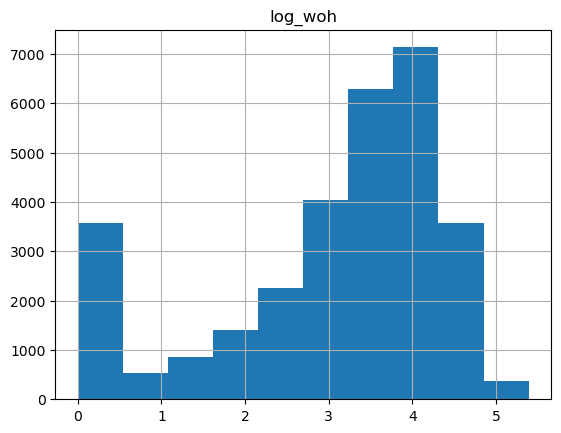

In [61]:
df['log_woh'] = np.log2(df['weekly_offline_hours']+1)

df.hist('log_woh')
plt.show()

# log transformation didnt work, so we can increment the zeros by 2 for example. but let us just make sure of the observation

In [9]:
# binning the age to reduce the effect of minor observations
bins = [18, 30, 40, 55, 66]

labels = [
    'Young Adult', 
    'Early Career', 
    'Mid Career', 
    'Senior Career'
]

df['group_age'] = pd.cut(
    df['age'],
    bins = bins,
    labels = labels,
    right = False,
    include_lowest=True
)

print(df['group_age'].value_counts())

group_age
Mid Career       9336
Young Adult      7388
Senior Career    6834
Early Career     6442
Name: count, dtype: int64


In [ ]:
df.boxplot(column=['actual_productivity_score'], by='age_group')

In [10]:
numeric_col = [
    'age',
    'daily_social_media_time',
    'number_of_notifications',
    'work_hours_per_day',
    'percieved_productivity_score'
    'stress_level',
    'screen_time_before_sleep',
    'breaks_during_work',
    'coffee_consumption_per_day',
    'days_feeling_burnout_per_month',
    'weekly_offline_hours',
    'job_satisfaction_score',
    'log_dsmt',
    'log_screen_time_before_sleep'
]

scaler = StandardScaler()
# df_scale = df.copy() 
# df_scale[numeric_col] = scaler.fit_transform(df[numeric_col])

In [11]:
categorical_cols = ['gender', 'job_type', 'social_platform_preference', 'group_age']

# --- OneHotEncoder inside ColumnTransformer ---
ct = ColumnTransformer(
    transformers=[
        ('cat', OneHotEncoder(sparse_output=False, handle_unknown='ignore', drop='first'), categorical_cols)
    ],
    remainder='passthrough'   # keep all other non-categorical columns
)

# Apply encoding
df_encoded = ct.fit_transform(df)

# Get names of OHE output columns
ohe_feature_names = ct.named_transformers_['cat'].get_feature_names_out(categorical_cols)

all_feature_names = list(ohe_feature_names) + [
    col for col in df.columns if col not in categorical_cols
]

# Convert to DataFrame
df_encoded = pd.DataFrame(df_encoded, columns=all_feature_names)

print(df_encoded.head().to_string())

  gender_Male gender_Other job_type_Finance job_type_Health job_type_IT job_type_Student job_type_Unemployed social_platform_preference_Instagram social_platform_preference_Telegram social_platform_preference_TikTok social_platform_preference_Twitter group_age_Mid Career group_age_Senior Career group_age_Young Adult age daily_social_media_time number_of_notifications work_hours_per_day perceived_productivity_score actual_productivity_score stress_level sleep_hours screen_time_before_sleep breaks_during_work uses_focus_apps has_digital_wellbeing_enabled coffee_consumption_per_day days_feeling_burnout_per_month weekly_offline_hours job_satisfaction_score  log_dsmt log_screen_time_before_sleep
0         1.0          0.0              0.0             0.0         0.0              0.0                 1.0                                  0.0                                 0.0                               0.0                                0.0                  0.0                     1.0     

In [12]:
df_encoded.isnull().sum()

gender_Male                                0
gender_Other                               0
job_type_Finance                           0
job_type_Health                            0
job_type_IT                                0
job_type_Student                           0
job_type_Unemployed                        0
social_platform_preference_Instagram       0
social_platform_preference_Telegram        0
social_platform_preference_TikTok          0
social_platform_preference_Twitter         0
group_age_Mid Career                       0
group_age_Senior Career                    0
group_age_Young Adult                      0
age                                        0
daily_social_media_time                    0
number_of_notifications                    0
work_hours_per_day                         0
perceived_productivity_score               0
actual_productivity_score               2365
stress_level                               0
sleep_hours                                0
screen_tim

In [13]:
mean_ads = df['actual_productivity_score'].mean()
df_encoded['actual_productivity_score'].fillna(mean_ads, inplace=True)

C:\Users\PC\AppData\Local\Temp\ipykernel_1056\1350986717.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df_encoded['actual_productivity_score'].fillna(mean_ads, inplace=True)
C:\Users\PC\AppData\Local\Temp\ipykernel_1056\1350986717.py:2: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_encoded['actual_prod

In [ ]:
selected_features = [
    'log_dsmt',        # log(daily_social_media_time)         
    'log_screen_time_before_sleep',     
    'stress_level',
    'job_satisfaction_score',
    'work_hours_per_day',
    'number_of_notifications',
    'group_age_Mid Career',
    'group_age_Senior Career',
    'group_age_Young Adult',
    'social_platform_preference_Instagram',       
    'social_platform_preference_Telegram',        
    'social_platform_preference_TikTok',          
    'social_platform_preference_Twitter',  
    'weekly_offline_hours'
]

x = df_encoded[selected_features]

target = df_encoded['actual_productivity_score']

x_train, x_test, y_train, y_test = train_test_split(x, target, test_size = 0.2, random_state = 42)

model = LinearRegression()
model.fit(x_train, y_train)

y_pred = model.predict(x_test)

mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

print("MSE:", mse)
print("RMSE:", rmse)
print("R² Score:", r2)

# df_encoded.info()

MSE: 1.1294953037402862
RMSE: 1.0627771656091818
R² Score: 0.6514200261877745
